In [136]:
import matplotlib.pyplot as plt
import numpy as np
import random
from PIL import Image
import PIL.ImageOps

import torchvision
import torchvision.datasets as datasets
import torchvision.transforms as transforms
from torch.utils.data import DataLoader, Dataset
import torchvision.utils
import torch
from torch.autograd import Variable
import torch.nn as nn
from torch import optim
import torch.nn.functional as F

from sklearn.metrics.pairwise import cosine_similarity
from sklearn.metrics import precision_score, recall_score, f1_score

import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix

from pytorch_metric_learning.samplers import MPerClassSampler

from collections import defaultdict
import cv2

from pytorch_grad_cam import EigenCAM
from pytorch_grad_cam.utils.image import show_cam_on_image
import math

from pytorch_metric_learning import losses

## Config

In [137]:
CONFIG = {
    "TRAINSET_DIR": "./dataset/Train",
    "TESTSET_DIR": "./dataset/Test",
    "VALSET_DIR": "./dataset/Valid",
    "UNSEEN_DIR": "./dataset/Unnseen",
    "BATCH_SIZE": 18,
    "EPOCH": 15,
    "IMAGE_SIZE": (224, 224),
    "EMBEDDING_SIZE": 128
}

In [138]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

## Helper Function

In [139]:
def imshow(img, text=None):
    npimg = img.numpy()
    plt.axis("off")
    if text:
        plt.text(75, 8, text, style='italic',fontweight='bold',
            bbox={'facecolor':'white', 'alpha':0.8, 'pad':10})

    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.show()

def show_plot(iteration,loss):
    plt.plot(iteration,loss)
    plt.show()

In [140]:
def recall_at_k(embeddings, labels, k=5):
    embeddings = embeddings.to(device)
    labels = labels.to(device)

    cosine_sim = torch.mm(embeddings, embeddings.t())
    _, indices = torch.topk(cosine_sim, k=k+1, dim=1)  # k+1 because first is self
    indices = indices[:, 1:]  # Remove self index

    correct_at_k = 0
    total = len(labels)

    for i in range(total):
        true_label = labels[i].item()
        retrieved_labels = labels[indices[i]].tolist()
        if true_label in retrieved_labels:
            correct_at_k += 1

    recall = correct_at_k / total
    print(f"Recall@{k}: {recall * 100:.2f}%")
    return recall

In [141]:
def denormalize(tensor):
    if tensor.size(0) == 1:  # grayscale
        mean = torch.tensor([0.5]).view(1, 1, 1)
        std = torch.tensor([0.5]).view(1, 1, 1)
    else:  # RGB
        mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
        std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)

    return tensor * std + mean

In [142]:
def calculate_nn_accuracy(embeddings, labels):
    sim_matrix = torch.matmul(embeddings, embeddings.t())
    batch_size = embeddings.size(0)
    correct = 0
    for i in range(batch_size):
        sim_row = sim_matrix[i].clone()
        sim_row[i] = -1  # Exclude self
        _, idx = torch.max(sim_row, dim=0)
        if labels[i] == labels[idx]:
            correct += 1
    return correct / (batch_size - 1) if batch_size > 1 else 0

## Load Dataset

In [143]:
transform = transforms.Compose([
    transforms.Resize(CONFIG['IMAGE_SIZE']),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

In [144]:
train_dataset = datasets.ImageFolder(root=CONFIG['TRAINSET_DIR'], transform=transform)
val_dataset = datasets.ImageFolder(root=CONFIG['VALSET_DIR'], transform=transform)
test_dataset = datasets.ImageFolder(root=CONFIG['TESTSET_DIR'], transform=transform)
unseen_dataset = datasets.ImageFolder(root=CONFIG['UNSEEN_DIR'], transform=transform)

In [145]:
dataset_size = len(train_dataset)
BATCH_SIZE = math.ceil(dataset_size / CONFIG["BATCH_SIZE"])

In [146]:
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=True)
unseen_loader = DataLoader(unseen_dataset, batch_size=BATCH_SIZE, shuffle=True)

## Setup

In [147]:
class DeepSearchShoeModel(nn.Module):
      def __init__(self, embedding_size=128):
          super(DeepSearchShoeModel, self).__init__()

          self.backbone = torchvision.models.resnet18(pretrained=True)

          in_dim = self.backbone.fc.in_features
          self.backbone.fc = nn.Identity()
          self.fc = nn.Linear(in_dim, embedding_size)
          self.dropout = nn.Dropout(0.3)

      def forward(self, x):
          feat = self.backbone(x)
          emb = self.fc(feat)
          emb = self.dropout(emb)
          emb = F.normalize(emb, p=2, dim=1)
          return emb

## Training

In [148]:
model = DeepSearchShoeModel(embedding_size=CONFIG['EMBEDDING_SIZE']).to(device)
loss_fn = losses.MultiSimilarityLoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.5)

In [149]:
train_losses = []
train_accuracies = []
val_losses = []
val_accuracies = []

for epoch in range(CONFIG['EPOCH']):
    running_loss = 0.0
    correct = 0
    total = 0
    model.train()
    
    for imgs, labels in train_loader:
        imgs = imgs.to(device)
        labels = labels.to(device)

        embeddings = model(imgs)
        loss = loss_fn(embeddings, labels)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        running_loss += loss.item()

        # คำนวณ train accuracy แบบเดียวกับ val
        sim_matrix = torch.matmul(embeddings, embeddings.t())
        batch_size = embeddings.size(0)
        for i in range(batch_size):
            sim_row = sim_matrix[i]
            sim_row[i] = -1  # exclude self
            _, idx = torch.max(sim_row, dim=0)
            if labels[i] == labels[idx]:
                correct += 1
            total += 1

    scheduler.step()

    avg_train_loss = running_loss / len(train_loader)
    train_losses.append(avg_train_loss)
    train_accuracy = correct / total if total > 0 else 0
    train_accuracies.append(train_accuracy)

    # Validation phase
    model.eval()
    val_running_loss = 0.0
    correct = 0
    total = 0

    with torch.no_grad():
        for imgs, labels in val_loader:
            imgs = imgs.to(device)
            labels = labels.to(device)

            embeddings = model(imgs)
            loss = loss_fn(embeddings, labels)
            val_running_loss += loss.item()

            sim_matrix = torch.matmul(embeddings, embeddings.t())

            batch_size = embeddings.size(0)
            for i in range(batch_size):
                sim_row = sim_matrix[i]
                sim_row[i] = -1  # exclude self
                _, idx = torch.max(sim_row, dim=0)
                if labels[i] == labels[idx]:
                    correct += 1
                total += 1

    avg_val_loss = val_running_loss / len(val_loader)
    val_losses.append(avg_val_loss)
    val_accuracy = correct / total if total > 0 else 0
    val_accuracies.append(val_accuracy)

    print(f"Epoch {epoch+1}, Train Loss: {avg_train_loss:.4f}, Train Acc: {train_accuracy:.4f}, Val Loss: {avg_val_loss:.4f}, Val Acc: {val_accuracy:.4f}")


Epoch 1, Train Loss: 0.8453, Train Acc: 0.5632, Val Loss: 0.8361, Val Acc: 0.8167
Epoch 2, Train Loss: 0.7517, Train Acc: 0.8599, Val Loss: 0.7819, Val Acc: 0.8500
Epoch 3, Train Loss: 0.7130, Train Acc: 0.9158, Val Loss: 0.8186, Val Acc: 0.8333
Epoch 4, Train Loss: 0.6667, Train Acc: 0.9707, Val Loss: 0.6297, Val Acc: 0.9000
Epoch 5, Train Loss: 0.6540, Train Acc: 0.9652, Val Loss: 0.7563, Val Acc: 0.8667
Epoch 6, Train Loss: 0.6596, Train Acc: 0.9579, Val Loss: 0.6932, Val Acc: 0.8833
Epoch 7, Train Loss: 0.6479, Train Acc: 0.9734, Val Loss: 0.5459, Val Acc: 0.9667
Epoch 8, Train Loss: 0.6402, Train Acc: 0.9835, Val Loss: 0.5192, Val Acc: 0.9667
Epoch 9, Train Loss: 0.6382, Train Acc: 0.9744, Val Loss: 0.5399, Val Acc: 0.9667
Epoch 10, Train Loss: 0.6241, Train Acc: 0.9826, Val Loss: 0.5780, Val Acc: 0.9167
Epoch 11, Train Loss: 0.6391, Train Acc: 0.9799, Val Loss: 0.5070, Val Acc: 0.9833
Epoch 12, Train Loss: 0.6280, Train Acc: 0.9799, Val Loss: 0.4785, Val Acc: 0.9833
Epoch 13, Tra

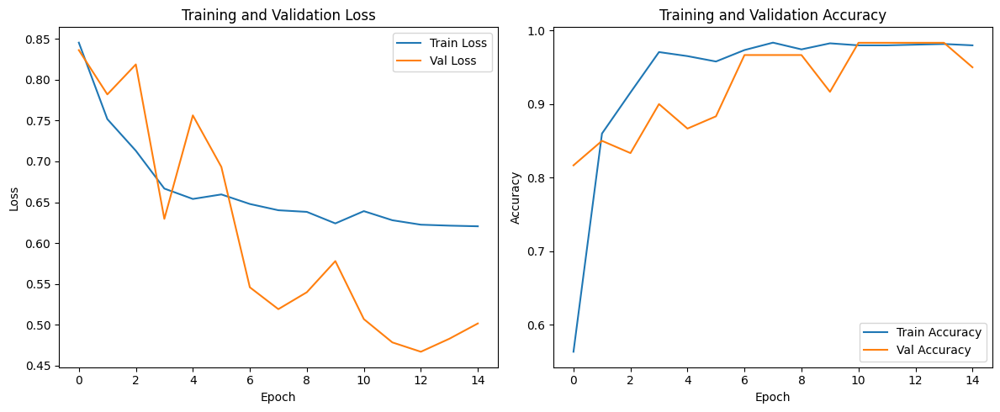

In [150]:
plt.figure(figsize=(12,5))

# กราฟ Loss
plt.subplot(1, 2, 1)
plt.plot(train_losses, label='Train Loss')
plt.plot(val_losses, label='Val Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()

# กราฟ Accuracy
plt.subplot(1, 2, 2)
plt.plot(train_accuracies, label='Train Accuracy')
plt.plot(val_accuracies, label='Val Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()

plt.tight_layout()
plt.show()

## Evaluate

In [151]:
model.eval()

DeepSearchShoeModel(
  (backbone): ResNet(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=Tr

In [152]:
with torch.no_grad():
    embeddings = []
    labels = []
    for images, targets in test_loader:
        images = images.to(device)
        targets = targets.to(device)
        output = model(images)
        embeddings.append(output)
        labels.append(targets)
    embeddings = torch.cat(embeddings)
    labels = torch.cat(labels)

In [153]:
embeddings = embeddings.to(device)
labels = labels.to(device)

cosine_sim = torch.mm(embeddings, embeddings.t())  # [N, N]

_, indices = torch.topk(cosine_sim, k=2, dim=1)
nearest_neighbor_indices = indices[:, 1]

nearest_labels = labels[nearest_neighbor_indices]
accuracy = (nearest_labels == labels).float().mean().item()

print(f"Nearest Neighbor Accuracy: {accuracy*100:.2f}%")

Nearest Neighbor Accuracy: 98.33%


In [154]:
embeddings = embeddings.to(device)
labels = labels.to(device)

cosine_sim = torch.mm(embeddings, embeddings.t())

_, indices = torch.topk(cosine_sim, k=2, dim=1)
nearest_neighbor_indices = indices[:, 1]

nearest_labels = labels[nearest_neighbor_indices]

class_correct = defaultdict(int)
class_total = defaultdict(int)

for i in range(len(labels)):
    true_label = labels[i].item()
    pred_label = nearest_labels[i].item()

    class_total[true_label] += 1
    if true_label == pred_label:
        class_correct[true_label] += 1

class_accuracy = {}
for c in class_total:
    class_accuracy[c] = class_correct[c] / class_total[c]

for c, acc in class_accuracy.items():
    print(f"Class {c}: Accuracy = {acc*100:.2f}%")


Class 6: Accuracy = 100.00%
Class 11: Accuracy = 100.00%
Class 8: Accuracy = 100.00%
Class 14: Accuracy = 100.00%
Class 7: Accuracy = 75.00%
Class 5: Accuracy = 100.00%
Class 0: Accuracy = 100.00%
Class 13: Accuracy = 100.00%
Class 9: Accuracy = 100.00%
Class 10: Accuracy = 100.00%
Class 2: Accuracy = 100.00%
Class 3: Accuracy = 100.00%
Class 4: Accuracy = 100.00%
Class 12: Accuracy = 100.00%
Class 1: Accuracy = 100.00%


In [155]:
def recall_at_k(embeddings, labels, k=5):
    embeddings = embeddings.to(device)
    labels = labels.to(device)

    cosine_sim = torch.mm(embeddings, embeddings.t())
    _, indices = torch.topk(cosine_sim, k=k+1, dim=1)  # k+1 because first is self
    indices = indices[:, 1:]  # Remove self index

    correct_at_k = 0
    total = len(labels)

    for i in range(total):
        true_label = labels[i].item()
        retrieved_labels = labels[indices[i]].tolist()
        if true_label in retrieved_labels:
            correct_at_k += 1

    recall = correct_at_k / total
    print(f"Recall@{k}: {recall * 100:.2f}%")
    return recall

In [156]:
recall = recall_at_k(embeddings, labels, k=5)

Recall@5: 98.33%


## Explainable AI

In [157]:
target_layers = [model.backbone.layer4[-1]]
cam = EigenCAM(model=model, target_layers=target_layers)

In [158]:
def denormalize(tensor):
    if tensor.size(0) == 1:  # grayscale
        mean = torch.tensor([0.5]).view(1, 1, 1)
        std = torch.tensor([0.5]).view(1, 1, 1)
    else:  # RGB
        mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
        std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)

    return tensor * std + mean

In [166]:
def visualize_worst_embeddings_cam(
    model, 
    data_loader, 
    cam, 
    denormalize_func, 
    class_names,
    device=None, 
    num_images=20, 
    rows=5, 
    cols=4
):
    if device is None:
        device = next(model.parameters()).device

    model.eval()
    embeddings = []
    labels_list = []
    images_list = []

    with torch.no_grad():
        for images, labels in data_loader:
            images = images.to(device)
            emb = model(images)
            embeddings.append(emb.cpu())
            labels_list.append(labels.cpu())
            images_list.append(images.cpu())

    embeddings = torch.cat(embeddings)
    labels_list = torch.cat(labels_list)
    images_list = torch.cat(images_list)

    class_centroids = {}
    for label in torch.unique(labels_list):
        class_embeddings = embeddings[labels_list == label]
        class_centroids[label.item()] = class_embeddings.mean(dim=0)

    distances = []
    for i in range(len(embeddings)):
        label = labels_list[i].item()
        emb = embeddings[i]
        centroid = class_centroids[label]
        dist = torch.norm(emb - centroid, p=2).item()
        distances.append((dist, i))

    distances.sort(key=lambda x: x[0], reverse=True)

    num_images = min(num_images, len(distances))
    fig, axs = plt.subplots(rows, cols, figsize=(cols*4, rows*4))
    axs = axs.flatten()

    for count in range(num_images):
        dist_value, idx = distances[count]
        img_tensor = images_list[idx]
        label = labels_list[idx].item()

        input_tensor = img_tensor.unsqueeze(0).to(device)
        input_tensor.requires_grad = True

        img_denorm = denormalize_func(img_tensor)
        img_numpy = np.transpose(img_denorm.numpy(), (1, 2, 0))
        img_numpy = np.clip(img_numpy, 0, 1)

        grayscale_cam = cam(input_tensor=input_tensor, targets=None)[0]
        cam_image = show_cam_on_image(img_numpy, grayscale_cam, use_rgb=True)

        axs[count].imshow(cam_image)
        axs[count].axis('off')
        if class_names is not None:
            axs[count].set_title(f"Dist: {dist_value:.4f}\nLabel: {class_names[label]}", fontsize=10)

    for j in range(num_images, rows*cols):
        axs[j].axis('off')

    plt.tight_layout()
    plt.show()

### Train set

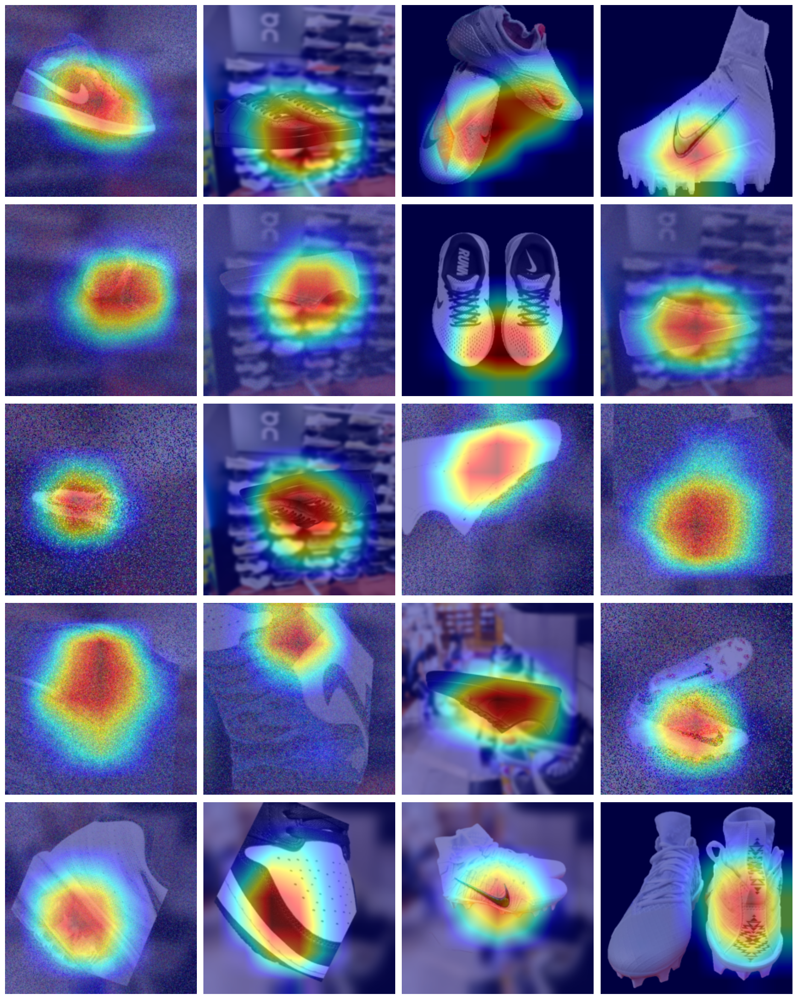

In [ ]:
class_names = train_dataset.classes
# class_names = None
visualize_worst_embeddings_cam(model, train_loader, cam, denormalize, class_names, device)

### Test Set

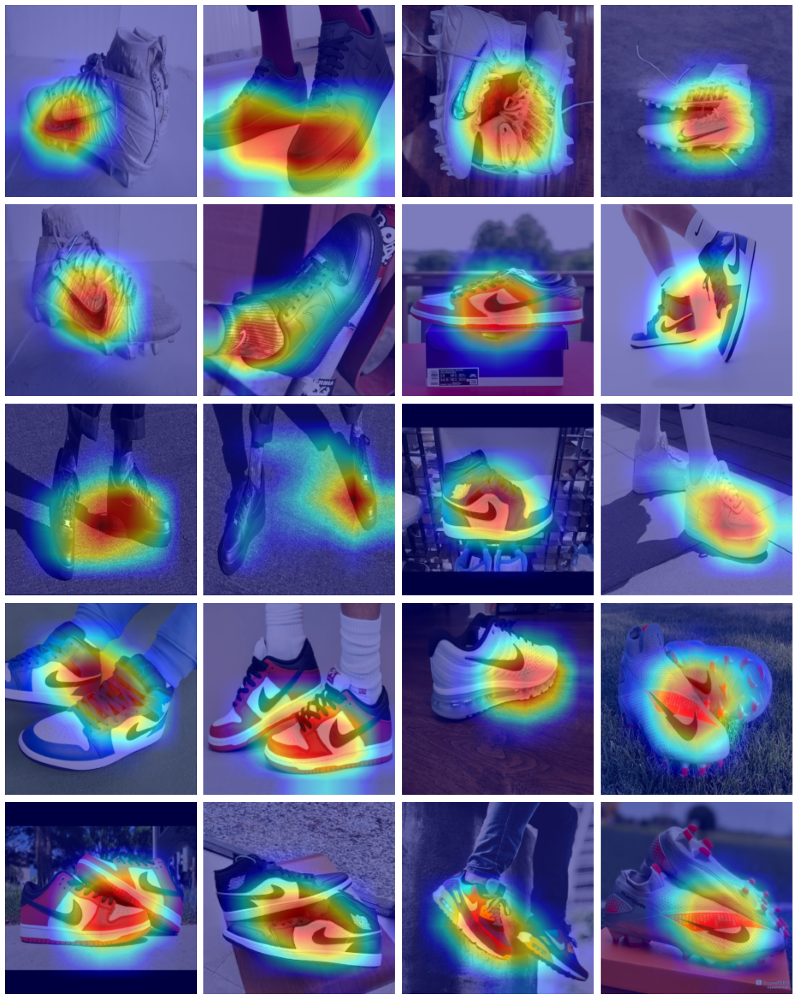

In [ ]:
class_names = test_dataset.classes
# class_names = None
visualize_worst_embeddings_cam(model, test_loader, cam, denormalize, class_names, device)

## Unseen Dat

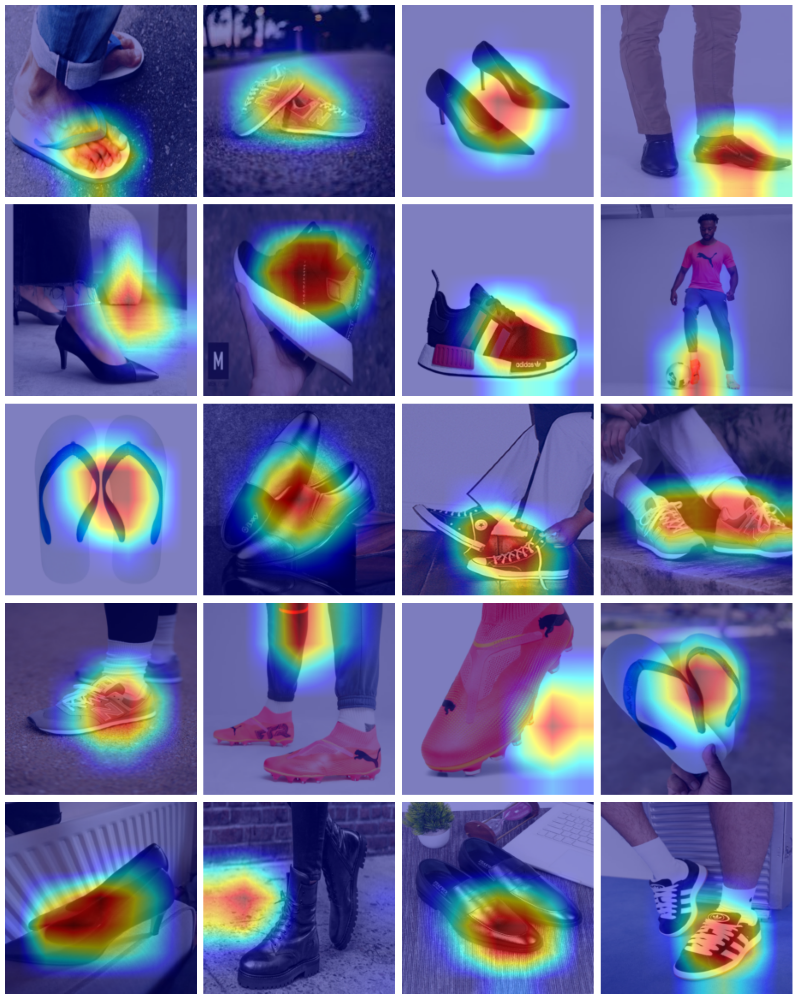

In [ ]:
class_names = unseen_dataset.classes
# class_names = None
visualize_worst_embeddings_cam(model, unseen_loader, cam, denormalize, class_names, device)

In [176]:
def visualize_worst_embeddings_cam_single(
    model, 
    data_loader, 
    cam, 
    denormalize_func, 
    class_names,
    device=None, 
    num_images=20, 
    target_class=None  # target_class เป็นชื่อหรือเลข index ก็ได้
):
    if device is None:
        device = next(model.parameters()).device

    # แปลงชื่อคลาสเป็น index ถ้าเป็น string
    if target_class is not None:
        if isinstance(target_class, str):
            # หา index ของชื่อ class ใน class_names
            try:
                target_class_idx = class_names.index(target_class)
            except ValueError:
                raise ValueError(f"Class name '{target_class}' not found in class_names list.")
        else:
            target_class_idx = target_class
    else:
        target_class_idx = None

    model.eval()
    embeddings = []
    labels_list = []
    images_list = []

    with torch.no_grad():
        for images, labels in data_loader:
            images = images.to(device)
            emb = model(images)
            embeddings.append(emb.cpu())
            labels_list.append(labels.cpu())
            images_list.append(images.cpu())

    embeddings = torch.cat(embeddings)
    labels_list = torch.cat(labels_list)
    images_list = torch.cat(images_list)

    class_centroids = {}
    for label in torch.unique(labels_list):
        class_embeddings = embeddings[labels_list == label]
        class_centroids[label.item()] = class_embeddings.mean(dim=0)

    distances = []
    for i in range(len(embeddings)):
        label = labels_list[i].item()
        if target_class_idx is not None and label != target_class_idx:
            continue
        emb = embeddings[i]
        centroid = class_centroids[label]
        dist = torch.norm(emb - centroid, p=2).item()
        distances.append((dist, i))

    distances.sort(key=lambda x: x[0], reverse=True)
    num_images = min(num_images, len(distances))

    for count in range(num_images):
        dist_value, idx = distances[count]
        img_tensor = images_list[idx]
        label = labels_list[idx].item()

        input_tensor = img_tensor.unsqueeze(0).to(device)
        input_tensor.requires_grad = True

        img_denorm = denormalize_func(img_tensor)
        img_numpy = np.transpose(img_denorm.numpy(), (1, 2, 0))
        img_numpy = np.clip(img_numpy, 0, 1)

        grayscale_cam = cam(input_tensor=input_tensor, targets=None)[0]
        cam_image = show_cam_on_image(img_numpy, grayscale_cam, use_rgb=True)

        plt.figure(figsize=(6,6))
        plt.imshow(cam_image)
        plt.axis('off')
        plt.show()


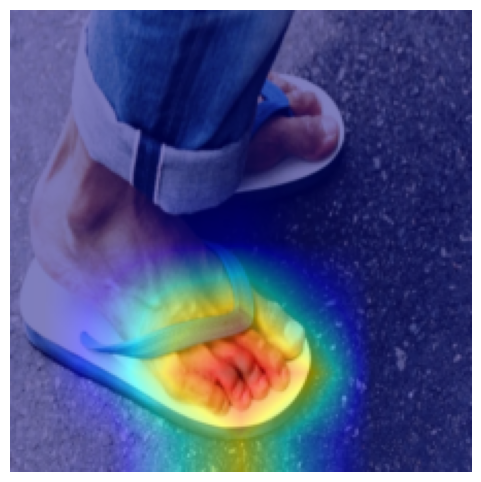

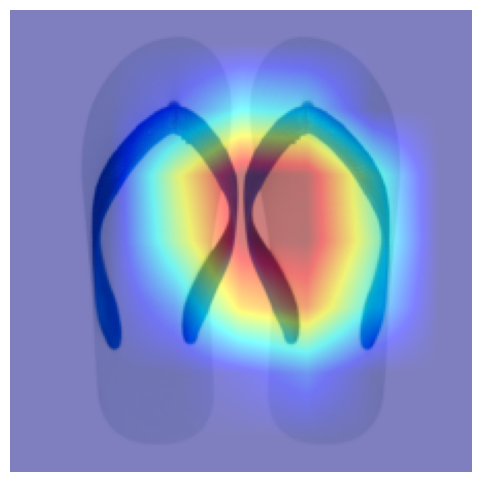

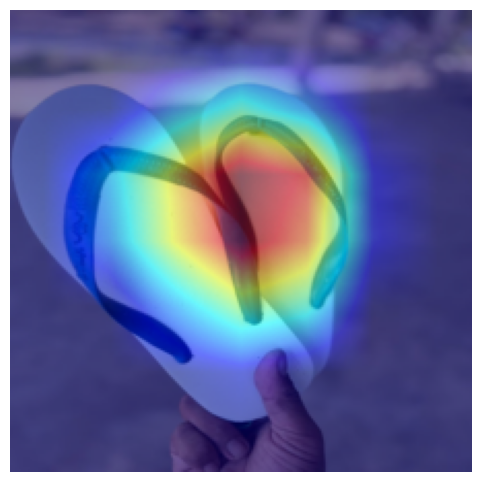

In [177]:
class_names = unseen_dataset.classes
visualize_worst_embeddings_cam_single(
    model,
    unseen_loader,
    cam,
    denormalize,
    class_names,
    device=device,
    num_images=5,
    target_class='Nanyang'  
)

## Export

In [163]:
torch.save(model.state_dict(), 'deep_search_shoe_model.pth')